In [1]:
# 윤서 tabnet 코드 (1)

import pandas as pd
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import time

# load data
train_df = pd.read_csv('C:/Users/sumin/Bitamin/2학기/conference/bitamin_ChurnProject/bitamin_ChurnProject/data/preprocessed_data/train_data.csv')
valid_df = pd.read_csv('C:/Users/sumin/Bitamin/2학기/conference/bitamin_ChurnProject/bitamin_ChurnProject/data/preprocessed_data/valid_data.csv')
x_train = train_df.drop(columns = ['cust_no', 'label'])
y_train = train_df['label']
x_valid = valid_df.drop(columns = ['cust_no', 'label'])
y_valid = valid_df['label']

x_train.fillna(0, inplace=True)
x_valid.fillna(0, inplace=True)

x_train = x_train.values
y_train = y_train.values
x_valid = x_valid.values
y_valid = y_valid.values

# tabnet
start_time = time.time()
clf = TabNetClassifier(n_d = 32, n_a = 32)
clf.fit(
    X_train=x_train,
    y_train=y_train,
    eval_set=[(x_train, y_train),(x_valid, y_valid)],
    eval_name=['train', 'valid'],
    eval_metric=['accuracy'],
    max_epochs=100, patience=20,
    batch_size=64, virtual_batch_size=128,
)
end_time = time.time()
print('걸린 시간 :', end_time - start_time)

y_pred = clf.predict(x_valid)
print('Accuracy: {:.2f}'.format(accuracy_score(y_valid, y_pred)))
print(confusion_matrix(y_valid, y_pred))
print(classification_report(y_valid, y_pred))




#
# # TabNetPretrainer
# unsupervised_model = TabNetPretrainer(
#     optimizer_fn=torch.optim.Adam,
#     optimizer_params=dict(lr=2e-2),
#     mask_type='entmax' # "sparsemax"
# )
#
# unsupervised_model.fit(
#     X_train=X_train,
#     eval_set=[X_valid],
#     pretraining_ratio=0.8,
# )
#
# clf = TabNetClassifier(
#     optimizer_fn=torch.optim.Adam,
#     optimizer_params=dict(lr=2e-2),
#     scheduler_params={"step_size":10, # how to use learning rate scheduler
#                       "gamma":0.9},
#     scheduler_fn=torch.optim.lr_scheduler.StepLR,
#     mask_type='sparsemax' # This will be overwritten if using pretrain model
# )
#
# clf.fit(
#     X_train=X_train, y_train=y_train,
#     eval_set=[(X_train, y_train), (X_valid, y_valid)],
#     eval_name=['train', 'valid'],
#     eval_metric=['auc'],
#     from_unsupervised=unsupervised_model
# )

c:\ProgramData\Anaconda3\lib\site-packages\pytorch_tabnet\abstract_model.py:75: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 0.82395 | train_accuracy: 0.64353 | valid_accuracy: 0.6521  |  0:06:39s
epoch 1  | loss: 0.7687  | train_accuracy: 0.63955 | valid_accuracy: 0.6444  |  0:14:06s
epoch 2  | loss: 0.74971 | train_accuracy: 0.63905 | valid_accuracy: 0.6438  |  0:21:24s
epoch 3  | loss: 0.74004 | train_accuracy: 0.63892 | valid_accuracy: 0.6439  |  0:28:44s
epoch 4  | loss: 0.73603 | train_accuracy: 0.64055 | valid_accuracy: 0.6467  |  0:36:19s
epoch 5  | loss: 0.73554 | train_accuracy: 0.63995 | valid_accuracy: 0.6447  |  1:00:30s
epoch 6  | loss: 0.72434 | train_accuracy: 0.6393  | valid_accuracy: 0.644   |  1:07:21s
epoch 7  | loss: 0.72385 | train_accuracy: 0.63963 | valid_accuracy: 0.6454  |  1:15:07s
epoch 8  | loss: 0.71782 | train_accuracy: 0.63886 | valid_accuracy: 0.6439  |  1:22:29s
epoch 9  | loss: 0.71325 | train_accuracy: 0.64014 | valid_accuracy: 0.6453  |  1:29:49s
epoch 10 | loss: 0.71044 | train_accuracy: 0.64057 | valid_accuracy: 0.6457  |  1:37:12s
epoch 11 | loss: 0.70

c:\ProgramData\Anaconda3\lib\site-packages\pytorch_tabnet\callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


걸린 시간 : 10633.603164434433
Accuracy: 0.65
[[ 135    0 1416]
 [  43    0 1967]
 [  51    2 6386]]
              precision    recall  f1-score   support

        -1.0       0.59      0.09      0.15      1551
         0.0       0.00      0.00      0.00      2010
         1.0       0.65      0.99      0.79      6439

    accuracy                           0.65     10000
   macro avg       0.41      0.36      0.31     10000
weighted avg       0.51      0.65      0.53     10000



### [XAI] 1. LIME

In [6]:
train_df = pd.read_csv('C:/Users/sumin/Bitamin/2학기/conference/bitamin_ChurnProject/bitamin_ChurnProject/data/preprocessed_data/train_data.csv')
valid_df = pd.read_csv('C:/Users/sumin/Bitamin/2학기/conference/bitamin_ChurnProject/bitamin_ChurnProject/data/preprocessed_data/valid_data.csv')
x_train = train_df.drop(columns = ['cust_no', 'label'])
y_train = train_df['label']
x_valid = valid_df.drop(columns = ['cust_no', 'label'])
y_valid = valid_df['label']

x_train.fillna(0, inplace=True)
x_valid.fillna(0, inplace=True)

In [8]:
test_df = pd.read_csv('C:/Users/sumin/Bitamin/2학기/conference/bitamin_ChurnProject/bitamin_ChurnProject/data/preprocessed_data/test_data.csv')
x_test = test_df.drop(columns = ['cust_no', 'label'])
y_test = test_df['label']

x_test.fillna(0, inplace=True)

In [19]:
import numpy as np
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['-1', '0', '1'],
    mode='classification'
)

In [20]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[1], # 확인하고 싶은 데이터의 인덱스
    predict_fn=clf.predict_proba,
    top_labels=3
)

exp.show_in_notebook(show_table=True)

1번 인덱스의 경우 -> 59%의 확률로 label이 '1'로 예측, 실제로는 '0'임  

In [11]:
x_train.shape

(125290, 83)

### [XAI] 2. SP-LIME

In [13]:
import lime
from lime import submodular_pick

# Let's use SP-LIME to return explanations on a few sample data sets 
# and obtain a non-redundant global decision perspective of the black-box model
sp_exp = submodular_pick.SubmodularPick(explainer, 
                                        x_train.values,
                                        predict_fn=clf.predict_proba, 
                                        num_features=83,
                                        num_exps_desired=5) # 5개의 데이터로 줄이기

In [14]:
# SP-LIME visualization
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')

SP-LIME Explanations.


SP-LIME Local Explanations


c:\ProgramData\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  func(*args, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 47924 (\N{HANGUL SYLLABLE MU}) missing from current font.
  func(*args, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from current font.
  func(*args, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 49373 (\N{HANGUL SYLLABLE SAENG}) missing from current font.
  func(*args, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 49328 (\N{HANGUL SYLLABLE SAN}) missing from current font.
  func(*args, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 51649 (\N{HANGUL SYLLABLE JIG}) missing from curre

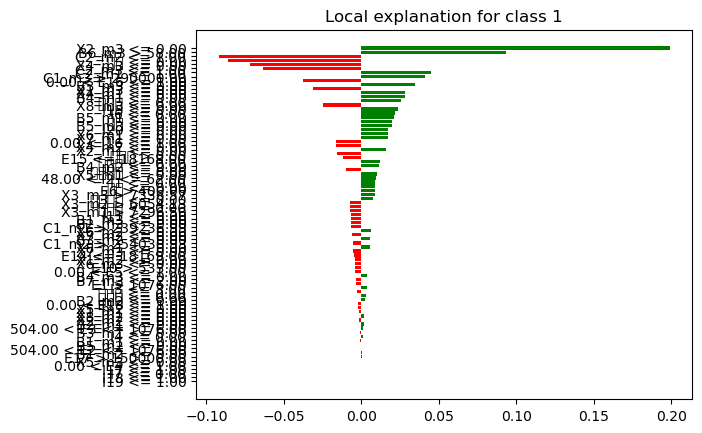

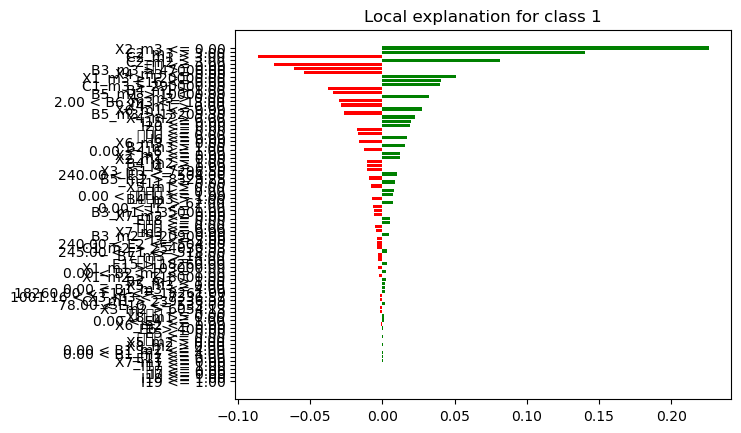

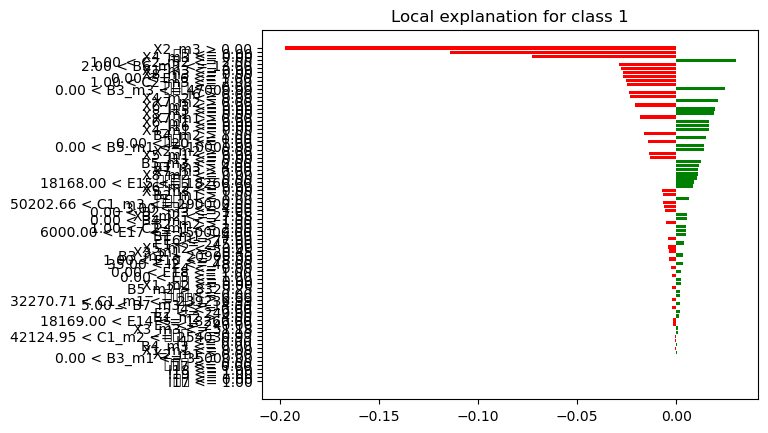

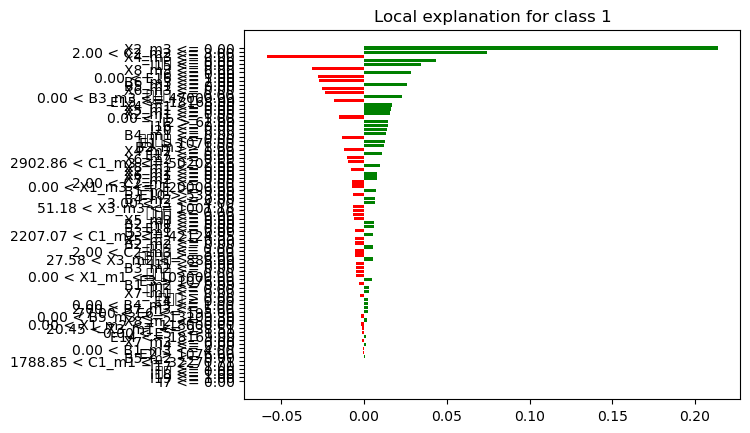

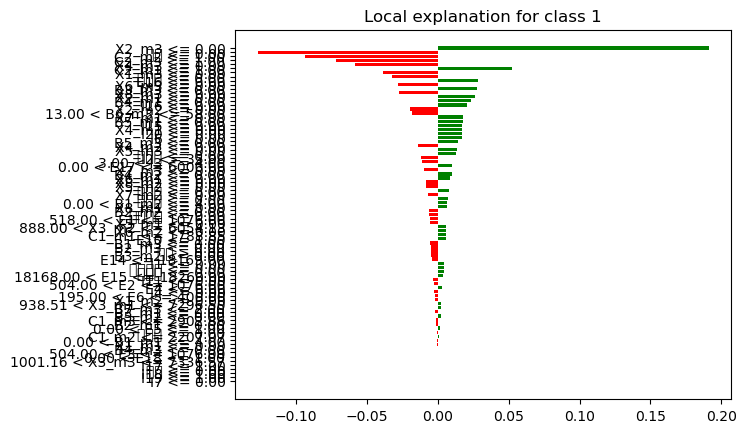

In [15]:
# SP-LIME Feature Importance
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_exp.sp_explanations]
print('SP-LIME Local Explanations')